# Mask R-CNN - Inspect Solar Training Data

Inspect and visualize data loading, training masks, anchors and ROIs (as part of the Region Proposal Network module).

In [1]:
import os
import sys
import itertools
import math
import logging
import json
import re
import random
import time
import concurrent.futures
from collections import OrderedDict
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.patches import Polygon
import imgaug
from imgaug import augmenters as iaa

# Root directory of the project
ROOT_DIR = os.path.abspath("../../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

import solar_4ch
IMAGES_DIR = os.path.join(ROOT_DIR, "pvpanels/data/images/")
MASKS_DIR = os.path.join(ROOT_DIR, "pvpanels/data/masks/")

%matplotlib inline 

Using TensorFlow backend.


## Configurations

We import configurations defined in `solar.py`.

In [2]:
config = solar_4ch.SolarConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            4
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              crop
IMAGE_SHAPE                    [512 512   4]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

## Dataset

In [3]:
# Load dataset
dataset = solar_4ch.SolarDataset()
dataset.load_solar(IMAGES_DIR, train_test_split=0.84, is_train=True)

# Must call before using the dataset
dataset.prepare()

print("Image Count: {}".format(len(dataset.image_ids)))
print("Class Count: {}".format(dataset.num_classes))
for i, info in enumerate(dataset.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Split ratio = 84%
Nb of training images = 1937
Image Count: 1937
Class Count: 2
  0. BG                                                
  1. solar array                                       


## Display Samples

Load and display images and masks.

In [8]:
# Select a random sample
image_ids = np.random.choice(dataset.image_ids, 4)
image_ids

array([2175,  310,  417, 1282])

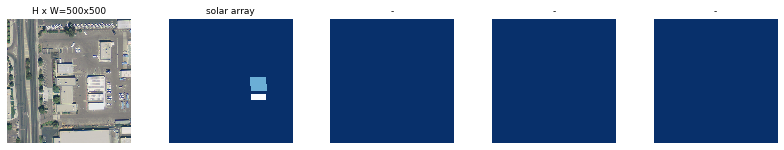

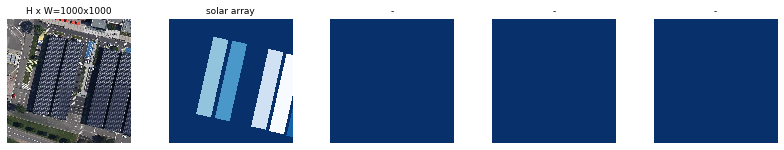

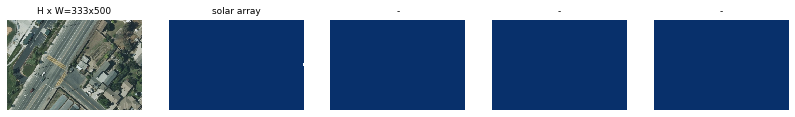

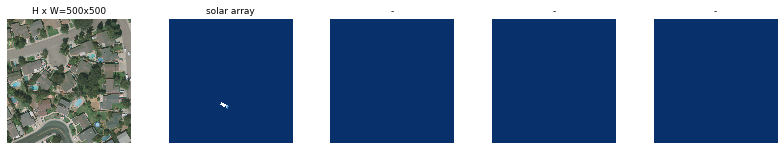

In [9]:
# Load and display sample
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id, MASKS_DIR)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)
    # add arg limit=1 to display_top_masks to show only 1 class

In [10]:
# Shape of the last randomly selected mask
mask.shape

(500, 500, 3)

molded_image             shape: (512, 512, 3)         min:    0.00000  max:  243.00000  uint8
mask                     shape: (512, 512, 2)         min:    0.00000  max:    1.00000  bool


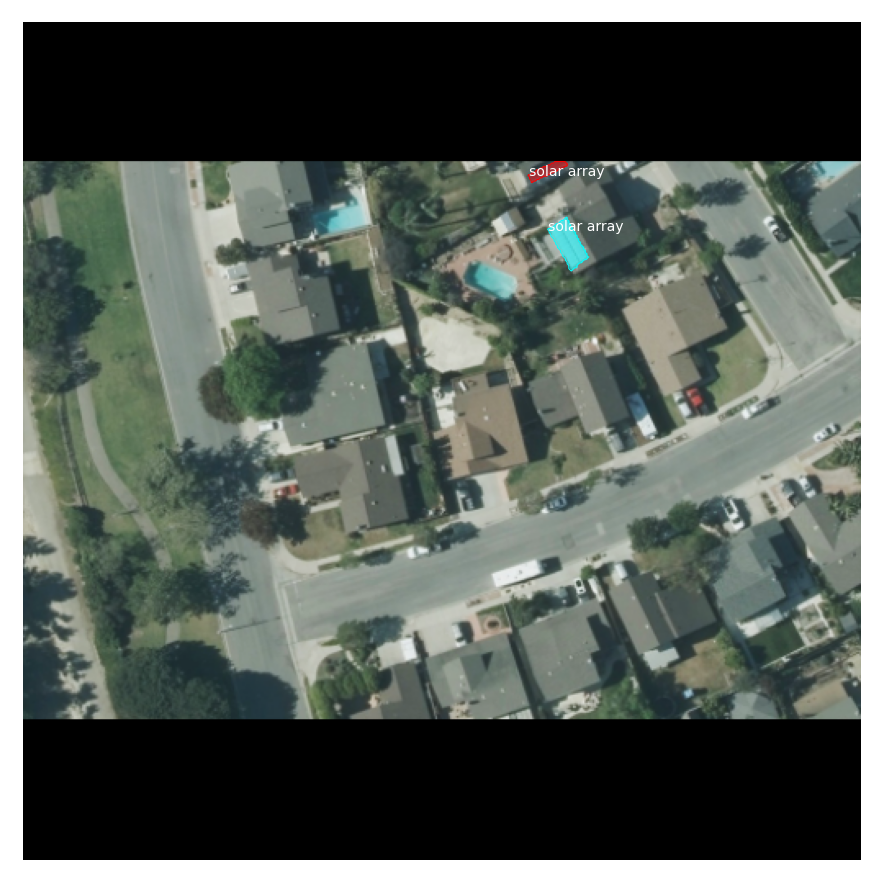

In [108]:
# Example of loading a specific image by its original filename
source_id = "619851917_07_11"

# Map source ID to Dataset image_id
# Notice the solar prefix: it's the name given to the dataset in SolarDataset
image_id = dataset.image_from_source_map["solar.{}".format(source_id)]

# Load and display
image, image_meta, class_ids, bbox, mask = solar.load_image_gt(
        dataset, config, image_id, use_mini_mask=False, masks_dir=MASKS_DIR)
log("molded_image", image)
log("mask", mask)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names,
                            show_bbox=False)

## Dataset stats

Loop through all images in the dataset and collect aggregate stats.

In [4]:
def image_stats(image_id):
    """Returns a dict of stats for one image."""
    image = dataset.load_image(image_id)
    mask, _ = dataset.load_mask(image_id, MASKS_DIR)
    bbox = utils.extract_bboxes(mask)
    # Sanity check
    assert mask.shape[:2] == image.shape[:2]
    # Return stats dict
    return {
        "id": image_id,
        "shape": list(image.shape),
        "bbox": [[b[2] - b[0], b[3] - b[1]]
                 for b in bbox
                 # Uncomment to exclude instances with 1 pixel width
                 # or height (often on edges)
                 # if b[2] - b[0] > 1 and b[3] - b[1] > 1
                ],
        "color": np.mean(image, axis=(0, 1)),
    }

# Loop through the dataset and compute stats over multiple threads
# This might take some time depending on nb and size of images
t_start = time.time()
with concurrent.futures.ThreadPoolExecutor() as e:
    stats = list(e.map(image_stats, dataset.image_ids))
t_total = time.time() - t_start
print("Total time: {:.1f} seconds".format(t_total))

Total time: 122.1 seconds


* Image size stats and mean color

Image Count:  1937
Height  mean: 554.69  median: 500.00  min: 333.00  max: 1002.00
Width   mean: 588.90  median: 500.00  min: 500.00  max: 1002.00
Color   mean (RGB-Y): 112.06 117.47 107.98 115.14


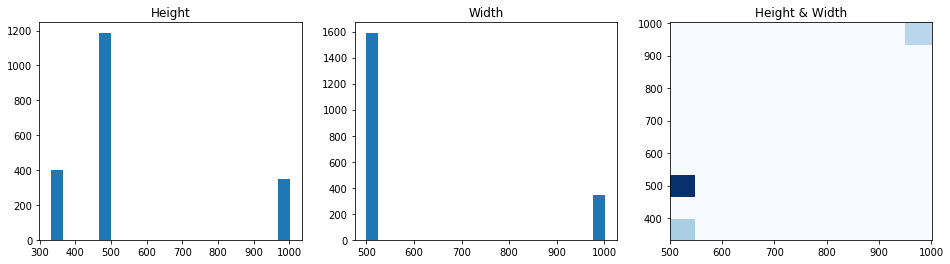

In [5]:
# Image stats
image_shape = np.array([s['shape'] for s in stats])
image_color = np.array([s['color'] for s in stats])
print("Image Count: ", image_shape.shape[0])
print("Height  mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
    np.mean(image_shape[:, 0]), np.median(image_shape[:, 0]),
    np.min(image_shape[:, 0]), np.max(image_shape[:, 0])))
print("Width   mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
    np.mean(image_shape[:, 1]), np.median(image_shape[:, 1]),
    np.min(image_shape[:, 1]), np.max(image_shape[:, 1])))
print("Color   mean (RGB-Y): {:.2f} {:.2f} {:.2f} {:.2f}".format(*np.mean(image_color, axis=0)))
# print("Color   mean (RGB): {:.3f} {:.3f} {:.3f}".format(*np.mean(image_color, axis=0)))


# Histograms
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
ax[0].set_title("Height")
_ = ax[0].hist(image_shape[:, 0], bins=20)
ax[1].set_title("Width")
_ = ax[1].hist(image_shape[:, 1], bins=20)
ax[2].set_title("Height & Width")
_ = ax[2].hist2d(image_shape[:, 1], image_shape[:, 0], bins=10, cmap="Blues")

We see that we have 3 image sizes in the dataset: 500x500, 500x333 and (approximately) 1000x1000.

We also get the mean pixel values for each one of the RGB color channels and for the relative luminance channel that we compute on the fly, as part of our custom `load_image` function (overriding the default `load_image` in the `Dataset` class). These mean values need to be used for image normalization during model training. We will therefore change the default `MEAN_PIXEL` parameter in the `Config` class before training the model.

* Panels per image

Panels/Image
Image area <=  408**2:  mean: 3.7  median: 1.0  min: 1.0  max: 118.0
Image area <=  500**2:  mean: 2.4  median: 2.0  min: 1.0  max: 26.0
Image area <= 1000**2:  mean: 5.1  median: 5.0  min: 1.0  max: 14.0


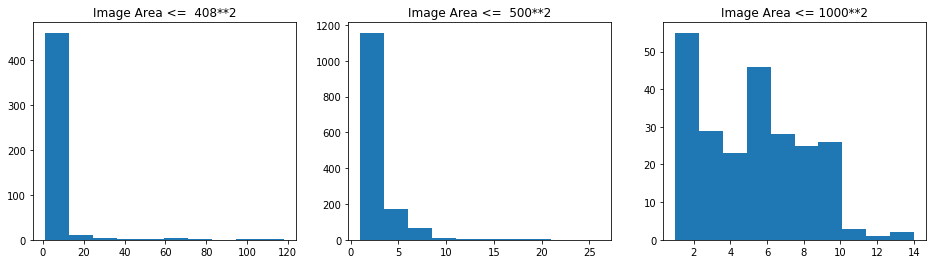

In [13]:
# Segment by image area (useful if you have images of different sizes)
image_area_bins = [500*333, 500**2, 1000**2]

print("Panels/Image")
fig, ax = plt.subplots(1, len(image_area_bins), figsize=(16, 4))
area_threshold = 0
for i, image_area in enumerate(image_area_bins):
    panels_per_image = np.array([len(s['bbox']) 
                                 for s in stats 
                                 if area_threshold < (s['shape'][0] * s['shape'][1]) <= image_area])
    area_threshold = image_area
    if len(panels_per_image) == 0:
        print("Image area <= {:4}**2: None".format(np.sqrt(image_area)))
        continue
    print("Image area <= {:4.0f}**2:  mean: {:.1f}  median: {:.1f}  min: {:.1f}  max: {:.1f}".format(
        np.sqrt(image_area), panels_per_image.mean(), np.median(panels_per_image), 
        panels_per_image.min(), panels_per_image.max()))
    ax[i].set_title("Image Area <= {:4.0f}**2".format(np.sqrt(image_area)))
    _ = ax[i].hist(panels_per_image, bins=10)

We can see that most images contain < 5 different solar panel instances, and almost all images contain < 10 panels.

* Panel size stats

In [14]:
image_area_bins

[166500, 250000, 1000000]


Image Area <= 408**2
  Total Panels:  1806
  Panel Height. mean: 26.40  median: 15.00  min: 1.00  max: 333.00
  Panel Width.  mean: 30.64  median: 19.00  min: 1.00  max: 357.00
  Panel Area.   mean: 893.90  median: 372.00  min: 1.00  max: 105561.00

Image Area <= 500**2
  Total Panels:  3411
  Panel Height. mean: 24.01  median: 18.00  min: 1.00  max: 264.00
  Panel Width.  mean: 26.82  median: 19.00  min: 1.00  max: 470.00
  Panel Area.   mean: 990.92  median: 352.00  min: 1.00  max: 69273.00

Image Area <= 1000**2
  Total Panels:  1210
  Panel Height. mean: 188.55  median: 130.00  min: 1.00  max: 1002.00
  Panel Width.  mean: 310.34  median: 260.00  min: 1.00  max: 997.00
  Panel Area.   mean: 72739.85  median: 37335.00  min: 1.00  max: 997997.00


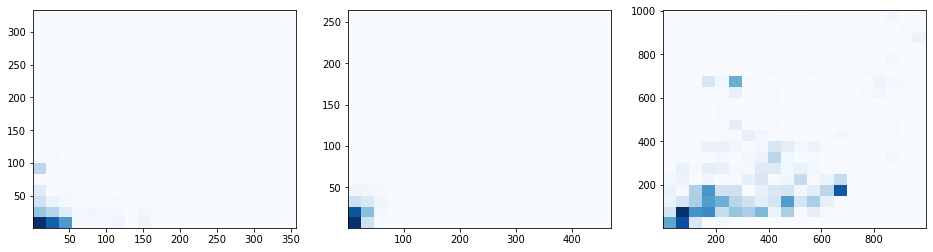

In [15]:
# Panel size stats
fig, ax = plt.subplots(1, len(image_area_bins), figsize=(16, 4))
area_threshold = 0
for i, image_area in enumerate(image_area_bins):
    panel_shape = np.array([
        b 
        for s in stats if area_threshold < (s['shape'][0] * s['shape'][1]) <= image_area
        for b in s['bbox']])

    if len(panel_shape) == 0: continue # line to skip empty image_area_bins
    
    panel_area = panel_shape[:, 0] * panel_shape[:, 1]
    area_threshold = image_area
    
    print("\nImage Area <= {:.0f}**2".format(np.sqrt(image_area)))
    print("  Total Panels: ", panel_shape.shape[0])
    print("  Panel Height. mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
        np.mean(panel_shape[:, 0]), np.median(panel_shape[:, 0]),
        np.min(panel_shape[:, 0]), np.max(panel_shape[:, 0])))
    print("  Panel Width.  mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
        np.mean(panel_shape[:, 1]), np.median(panel_shape[:, 1]),
        np.min(panel_shape[:, 1]), np.max(panel_shape[:, 1])))
    print("  Panel Area.   mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
        np.mean(panel_area), np.median(panel_area),
        np.min(panel_area), np.max(panel_area)))

    # Show 2D histogram
    _ = ax[i].hist2d(panel_shape[:, 1], panel_shape[:, 0], bins=20, cmap="Blues")

We can see that most panels are below 50x50 pixels in size, and that very few panels can be larger (see outliers in light blue in the graph).

Remark: for the square images (500x500, graph in the middle), 1 pixel = 30 cm, vs. 1 pixel = 10 cm for the other images (graphs on the left and on the right) - as the computed area is in pixels, this creates a bias in the visualization.

Panel Aspect Ratio.  mean: 1.48  median: 0.88  min: 0.02  max: 47.50


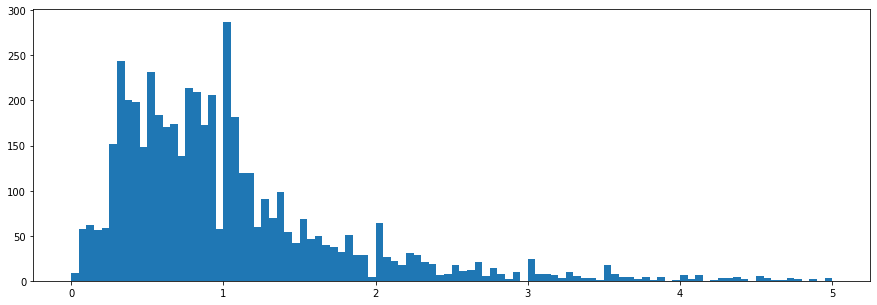

In [16]:
# Panel height/width ratio
area_threshold = 0
panel_shape = np.array([
        b 
        for s in stats if area_threshold < (s['shape'][0] * s['shape'][1]) <= 500**2
        for b in s['bbox']])
panel_aspect_ratio = panel_shape[:, 0] / panel_shape[:, 1]
print("Panel Aspect Ratio.  mean: {:.2f}  median: {:.2f}  min: {:.2f}  max: {:.2f}".format(
    np.mean(panel_aspect_ratio), np.median(panel_aspect_ratio),
    np.min(panel_aspect_ratio), np.max(panel_aspect_ratio)))
plt.figure(figsize=(15, 5))
_ = plt.hist(panel_aspect_ratio, bins=100, range=[0, 5])

Most panels can fit in rectangles (bounding boxes) of aspect ratio 0.5 to 2 (i.e. rectangles with 1 side 2 times longer than the other, computed in a way or the other). A few outliers are much longer (aspect ratio of 3, 4, 5, or close to 0).

## Color analysis

* Color clustering

In [115]:
from sklearn.cluster import KMeans
from collections import Counter
from skimage.color import rgb2lab, deltaE_cie76

In [17]:
# Transform RGB colors to hex format for clustering
def RGB2HEX(color):
    return "#{:02x}{:02x}{:02x}".format(int(color[0]), int(color[1]), int(color[2]))

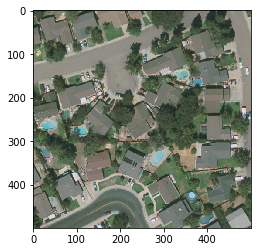

In [18]:
plt.imshow(image);

In [123]:
def get_colors(image, number_of_colors, show_chart=True):
    
    # Reshape image to 2 dimensions for Kmeans
    modified_image = image.reshape(image.shape[0]*image.shape[1], 3)

    # Cluster colors in image
    clf = KMeans(n_clusters = number_of_colors)
    labels = clf.fit_predict(modified_image)

    counts = Counter(labels)

    center_colors = clf.cluster_centers_
    # We get ordered colors by iterating through the keys
    ordered_colors = [center_colors[i] for i in counts.keys()]
    hex_colors = [RGB2HEX(ordered_colors[i]) for i in counts.keys()]
    rgb_colors = [ordered_colors[i] for i in counts.keys()]

    if (show_chart):
        plt.figure(figsize = (8, 6))
        plt.pie(counts.values(), labels = hex_colors, colors = hex_colors)

    return rgb_colors

[array([136.05105593, 130.48186671, 115.89271926]),
 array([67.638871  , 82.68930292, 62.92873798]),
 array([117.18898903, 118.22652821, 103.77096395]),
 array([49.64830592, 62.95264514, 51.50988706]),
 array([ 86.93350007, 106.0085626 ,  81.76442548]),
 array([196.59190761, 185.78301641, 176.88434488]),
 array([159.46850394, 142.58478143, 122.25862069]),
 array([168.81085909, 162.95523196, 150.89379094])]

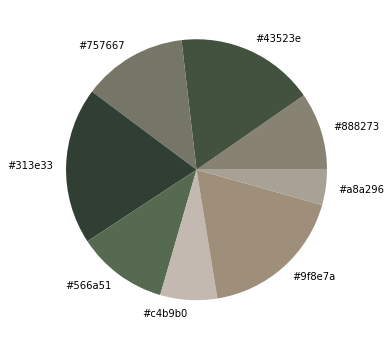

In [124]:
get_colors(image, 8)

To go further, this [blog article](https://towardsdatascience.com/color-identification-in-images-machine-learning-application-b26e770c4c71) explains how to filter images in a dataset based on color similarity.

* 3D color representation

In [21]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors
import cv2

In [24]:
image.shape

(500, 500, 3)

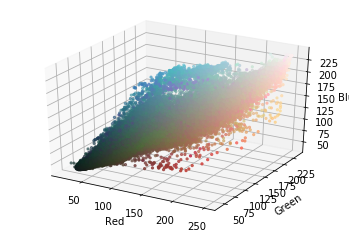

In [27]:
# Plot in the RGB space
r, g, b = cv2.split(image)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")
pixel_colors = image.reshape((np.shape(image)[0]*np.shape(image)[1], 3))
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()
axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
plt.show()

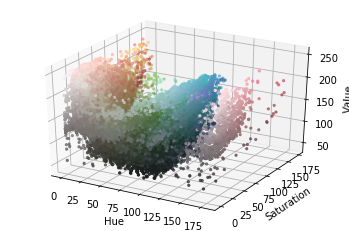

In [28]:
# Same plot in HSV (Hue-Saturation-Value) color space
hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
h, s, v = cv2.split(hsv_image)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")
axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Hue")
axis.set_ylabel("Saturation")
axis.set_zlabel("Value")
plt.show()

* Color masks

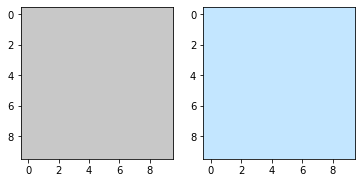

In [31]:
# Choose colors to mask

from matplotlib.colors import hsv_to_rgb

light_white = (0, 0, 200)
dark_white = (145, 60, 255)
lw_square = np.full((10, 10, 3), light_white, dtype=np.uint8) / 255.0
dw_square = np.full((10, 10, 3), dark_white, dtype=np.uint8) / 255.0

plt.subplot(1, 2, 1)
plt.imshow(hsv_to_rgb(lw_square))
plt.subplot(1, 2, 2)
plt.imshow(hsv_to_rgb(dw_square))
plt.show()

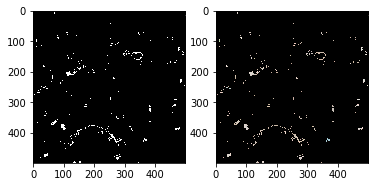

In [32]:
# Show mask and masked image side by side
mask_white = cv2.inRange(hsv_image, light_white, dark_blue)
result_white = cv2.bitwise_and(image, image, mask=mask_white)

plt.subplot(1, 2, 1)
plt.imshow(mask_white, cmap="gray")
plt.subplot(1, 2, 2)
plt.imshow(result_white)
plt.show()

To go further and create masks by color (potentially useful for detection of colorful objects), please refer to this [blog post](https://realpython.com/python-opencv-color-spaces/).

## Image augmentation

Test out different augmentation methods.

In [104]:
# List of augmentations
augmentation = iaa.Sometimes(0.9, [
    iaa.Fliplr(0.5),
    iaa.Flipud(0.5),
    iaa.Multiply((0.8, 1.2)), # luminosity
    iaa.LinearContrast((0.8, 1.2)),
    iaa.GaussianBlur(sigma=(0.0, 0.5)),
    iaa.geometric.Rotate(rotate=[90, 180, 270, 360])
])

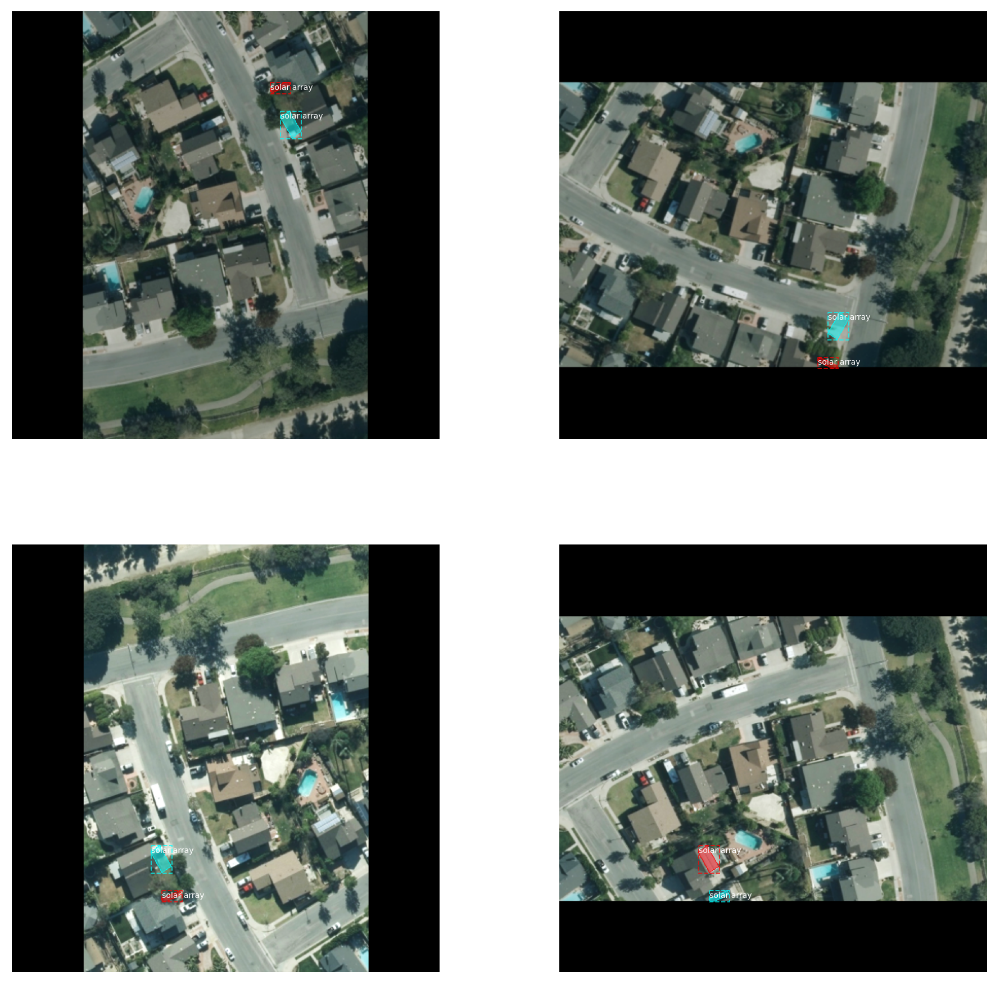

In [106]:
# Load the image multiple times to show augmentations

def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

limit = 4
ax = get_ax(rows=2, cols=limit//2)
for i in range(limit):
    image, image_meta, class_ids, bbox, mask = solar.load_image_gt(
        dataset, config, image_id, use_mini_mask=False, augment=False,
        augmentation=augmentation, masks_dir=MASKS_DIR)
    visualize.display_instances(image, bbox, mask, class_ids,
                                dataset.class_names, ax=ax[i//2, i % 2],
                                show_mask=True, show_bbox=True)

## Bounding Boxes

Rather than using bounding box coordinates provided by the source datasets, we compute the bounding boxes from masks instead. This allows us to handle bounding boxes consistently regardless of the source dataset, and it also makes it easier to resize, rotate, or crop images because we simply generate the bounding boxes from the updated masks rather than computing bounding box transformations for each type of image transformation.

image_id  1476 /Users/Thomas/emp-demeter/demeter/pvpanels/data/solar/images/10sfh465030_06_01.png
image                    shape: (500, 500, 3)         min:   26.00000  max:  250.00000  uint8
mask                     shape: (500, 500, 1)         min:    0.00000  max:    1.00000  bool
class_ids                shape: (1,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (1, 4)                min:  291.00000  max:  446.00000  int32


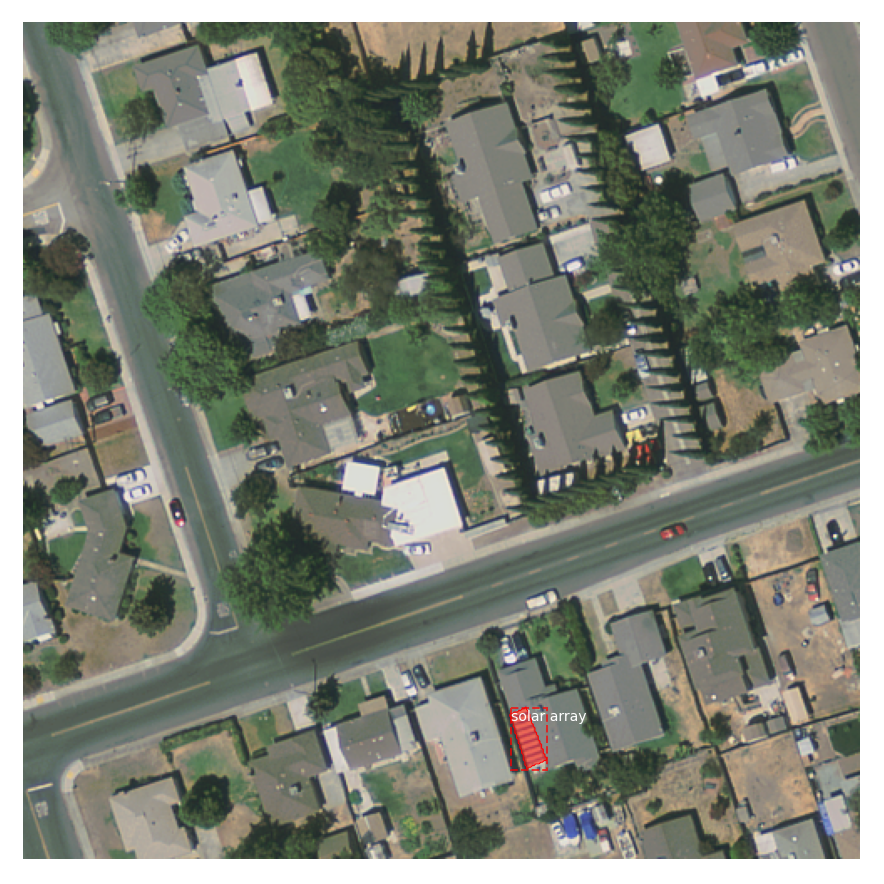

In [107]:
# Load random image and mask
image_id = random.choice(dataset.image_ids)
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id, MASKS_DIR)

# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id ", image_id, dataset.image_reference(image_id))
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)

# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Resize Images

To support multiple images per batch, images can be resized to a unique size. We can choose either to crop images or to preserve aspect ratio: if an image is not square, then zero padding is added at the top/bottom or right/left.

Here, we pad images with zeros so that they are of size 512x512 and can be divided by 2 six times when downscaling and upscaling.

image_id:  1182 /Users/Thomas/emp-demeter/demeter/pvpanels/data/solar/images/10sfg465970_08_08.png
Original shape:  (500, 500, 3)
image                    shape: (512, 512, 3)         min:   27.00000  max:  247.00000  uint8
mask                     shape: (512, 512, 4)         min:    0.00000  max:    1.00000  bool
class_ids                shape: (4,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (4, 4)                min:   65.00000  max:  512.00000  int32


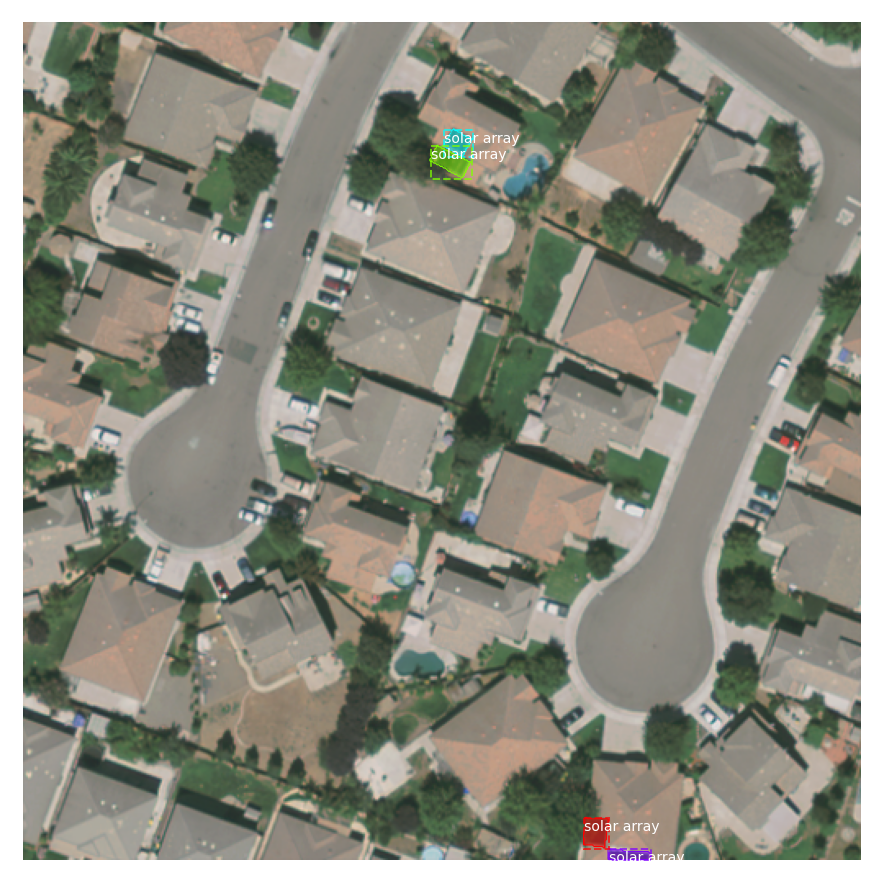

In [112]:
# Load random image and mask.
image_id = np.random.choice(dataset.image_ids, 1)[0]
image = dataset.load_image(image_id)
mask, class_ids = dataset.load_mask(image_id, MASKS_DIR)
original_shape = image.shape

# Resize
image, window, scale, padding, _ = utils.resize_image(
    image, 
    min_dim=config.IMAGE_MIN_DIM, 
    max_dim=config.IMAGE_MAX_DIM,
    mode=config.IMAGE_RESIZE_MODE)
mask = utils.resize_mask(mask, scale, padding)

# Compute Bounding box
bbox = utils.extract_bboxes(mask)

# Display image and additional stats
print("image_id: ", image_id, dataset.image_reference(image_id))
print("Original shape: ", original_shape)
log("image", image)
log("mask", mask)
log("class_ids", class_ids)
log("bbox", bbox)

# Display image and instances
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Mini Masks

Instance binary masks can get large when training with high resolution images. For example, if training with 1024x1024 image then the mask of a single instance requires 1MB of memory (Numpy uses bytes for boolean values). If an image has 100 instances then that's 100MB for the masks alone. 

To improve training speed, we optimize masks by:
* We store mask pixels that are inside the object bounding box, rather than a mask of the full image. Most objects are small compared to the image size, so we save space by not storing a lot of zeros around the object.
* We resize the mask to a smaller size (e.g. 56x56). For objects that are larger than the selected size we lose a bit of accuracy. But most object annotations are not very accurate to begin with, so this loss is negligable for most practical purposes. Thie size of the mini_mask can be set in the config class.

To visualize the effect of mask resizing, and to verify the code correctness, we can visualize some examples.

image                    shape: (512, 512, 3)         min:   30.00000  max:  248.00000  uint8
image_meta               shape: (14,)                 min:    0.00000  max:  734.00000  float64
class_ids                shape: (2,)                  min:    1.00000  max:    1.00000  int32
bbox                     shape: (2, 4)                min:   71.00000  max:  272.00000  int32
mask                     shape: (512, 512, 2)         min:    0.00000  max:    1.00000  bool


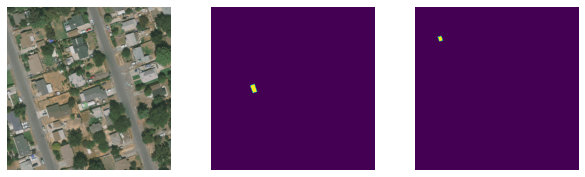

In [113]:
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, class_ids, bbox, mask = solar.load_image_gt(
    dataset, config, image_id, use_mini_mask=False, masks_dir=MASKS_DIR)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

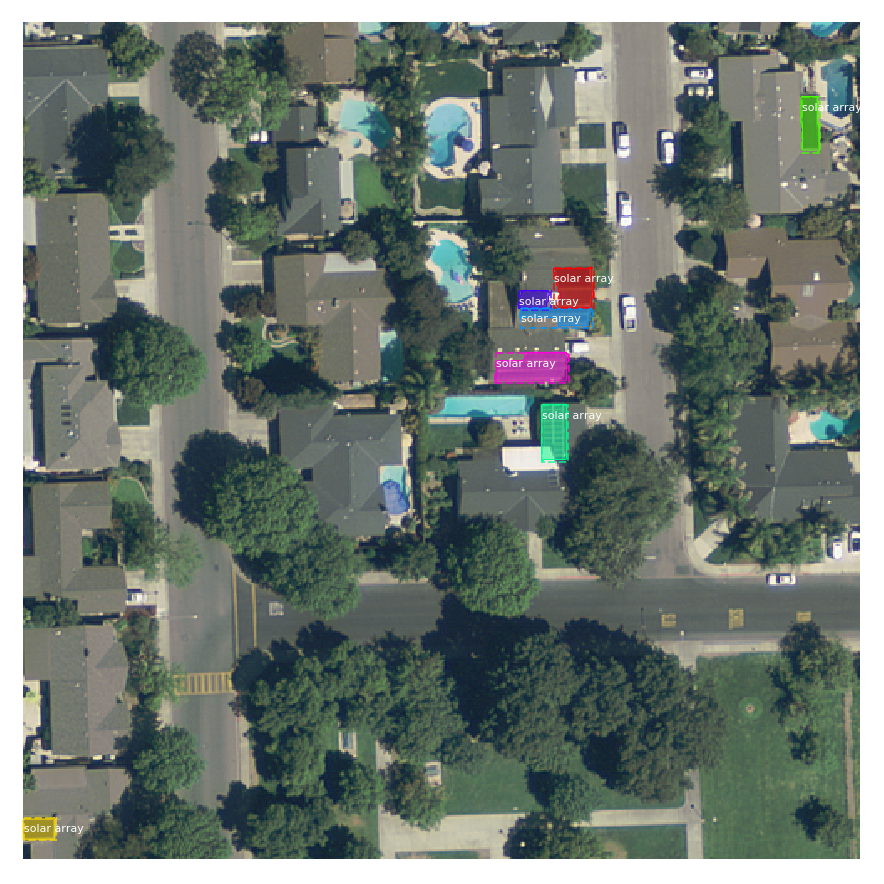

In [22]:
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

mask                     shape: (256, 256, 7)         min:    0.00000  max:    1.00000  bool


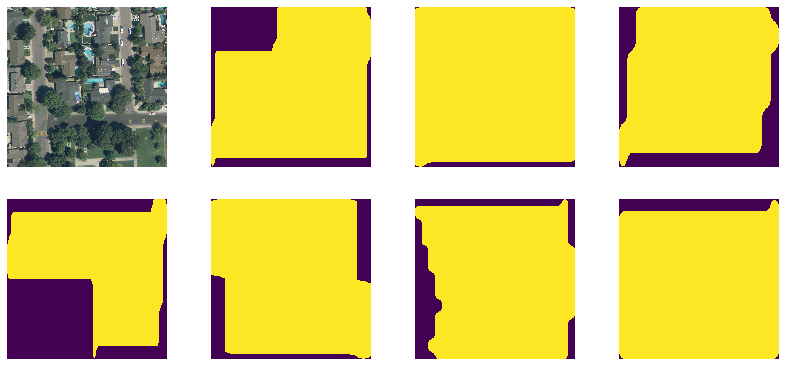

In [23]:
# Add augmentation and mask resizing.
image, image_meta, class_ids, bbox, mask = solar.load_image_gt(
    dataset, config, image_id, augment=True, use_mini_mask=True, masks_dir=MASKS_DIR)
log("mask", mask)
display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

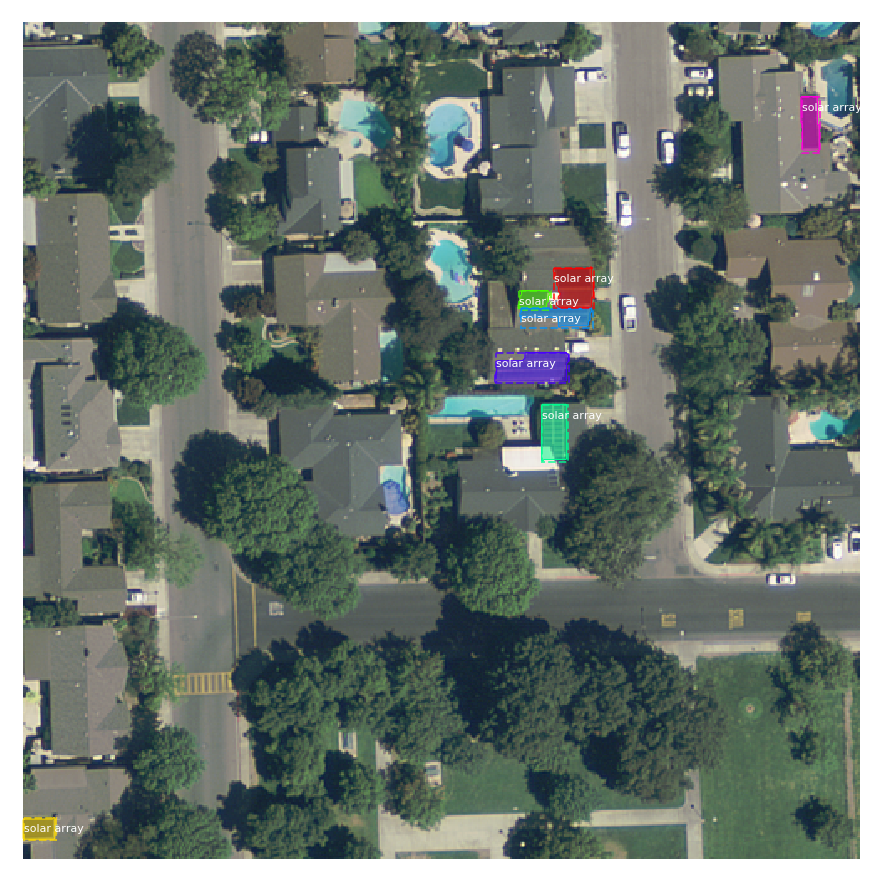

In [24]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

## Anchors

Anchors are "default boxes" that are used to match locations in the original image with outputs of the convolutional layers.

The order of anchors is important. Use the same order in training and prediction phases. It must also match the order of the convolution execution.

For an FPN network, the anchors must be ordered in a way that makes it easy to match anchors to the output of the convolution layers that predict anchor scores and shifts. 
* Sort by pyramid level first. All anchors of the first level, then all of the second and so on. This makes it easier to separate anchors by level.
* Within each level, sort anchors by feature map processing sequence. Typically, a convolution layer processes a feature map starting from top-left and moving right row by row. 
* For each feature map cell, pick any sorting order for the anchors of different ratios. Here we match the order of ratios passed to the function.

**Anchor Stride:**
In the FPN architecture, feature maps at the first few layers are high resolution. For example, if the input image is 1024x1024 then the feature meap of the first layer is 256x256, which generates about 200K anchors (256 * 256 * 3). These anchors are 32x32 pixels and their stride relative to image pixels is 4 pixels, so there is a lot of overlap. We can reduce the load significantly if we generate anchors for every other cell in the feature map. A stride of 2 will cut the number of anchors by 4, for example.

In [5]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

# Print summary of anchors
num_levels = len(backbone_shapes)
anchors_per_cell = len(config.RPN_ANCHOR_RATIOS)
print("Count: ", anchors.shape[0])
print("Scales: ", config.RPN_ANCHOR_SCALES)
print("ratios: ", config.RPN_ANCHOR_RATIOS)
print("Anchors per Cell: ", anchors_per_cell)
print("Levels: ", num_levels)
anchors_per_level = []
for l in range(num_levels):
    num_cells = backbone_shapes[l][0] * backbone_shapes[l][1]
    anchors_per_level.append(anchors_per_cell * num_cells // config.RPN_ANCHOR_STRIDE**2)
    print("Anchors in Level {}: {}".format(l, anchors_per_level[l]))

Count:  62814
Scales:  (8, 16, 32, 64, 128)
ratios:  [0.5, 1, 2]
Anchors per Cell:  3
Levels:  5
Anchors in Level 0: 46875
Anchors in Level 1: 11907
Anchors in Level 2: 3072
Anchors in Level 3: 768
Anchors in Level 4: 192


Visualize anchors of one cell at the center of the feature map of a specific level.

Level 0. Anchors:  46875  Feature map Shape: [125 125]
Level 1. Anchors:  11907  Feature map Shape: [63 63]
Level 2. Anchors:   3072  Feature map Shape: [32 32]
Level 3. Anchors:    768  Feature map Shape: [16 16]
Level 4. Anchors:    192  Feature map Shape: [8 8]


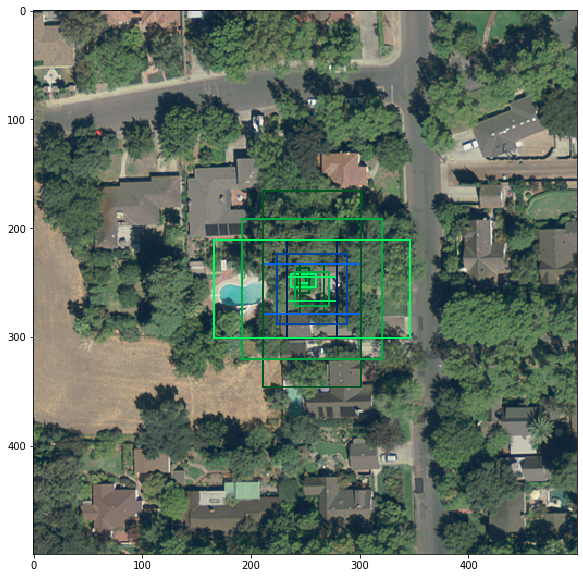

In [6]:
## Visualize anchors of one cell at the center of the feature map of a specific level

# Load and draw random image
image_id = np.random.choice(dataset.image_ids, 1)[0]
image, image_meta, _, _, _ = modellib.load_image_gt(dataset, config, image_id)
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.imshow(image)
levels = len(backbone_shapes)

for level in range(levels):
    colors = visualize.random_colors(levels)
    # Compute the index of the anchors at the center of the image
    level_start = sum(anchors_per_level[:level]) # sum of anchors of previous levels
    level_anchors = anchors[level_start:level_start+anchors_per_level[level]]
    print("Level {}. Anchors: {:6}  Feature map Shape: {}".format(level, level_anchors.shape[0], 
                                                                  backbone_shapes[level]))
    center_cell = backbone_shapes[level] // 2
    center_cell_index = (center_cell[0] * backbone_shapes[level][1] + center_cell[1])
    level_center = center_cell_index * anchors_per_cell 
    center_anchor = anchors_per_cell * (
        (center_cell[0] * backbone_shapes[level][1] / config.RPN_ANCHOR_STRIDE**2) \
        + center_cell[1] / config.RPN_ANCHOR_STRIDE)
    level_center = int(center_anchor)

    # Draw anchors. Brightness show the order in the array, dark to bright.
    for i, rect in enumerate(level_anchors[level_center:level_center+anchors_per_cell]):
        y1, x1, y2, x2 = rect
        p = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, facecolor='none',
                              edgecolor=(i+1)*np.array(colors[level]) / anchors_per_cell)
        ax.add_patch(p)

## Data Generator


In [7]:
# Create data generator
random_rois = 2000
g = modellib.data_generator(
    dataset, config, shuffle=True, random_rois=random_rois, 
    batch_size=4,
    detection_targets=True)

In [8]:
# Uncomment to run the generator through a lot of images
# to catch rare errors
# for i in range(1000):
#     print(i)
#     _, _ = next(g)

In [13]:
# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = next(g)
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)
    
log("gt_class_ids", gt_class_ids)
log("gt_boxes", gt_boxes)
log("gt_masks", gt_masks)
log("rpn_match", rpn_match, )
log("rpn_bbox", rpn_bbox)
image_id = modellib.parse_image_meta(image_meta)["image_id"][0]
print("image_id: ", image_id, dataset.image_reference(image_id))

# Remove the last dim in mrcnn_class_ids. It's only added
# to satisfy Keras restriction on target shape.
mrcnn_class_ids = mrcnn_class_ids[:,:,0]

rois                     shape: (4, 128, 4)           min:    0.00000  max:  499.00000  int32
mrcnn_class_ids          shape: (4, 128, 1)           min:    0.00000  max:    1.00000  int32
mrcnn_bbox               shape: (4, 128, 2, 4)        min:   -3.36047  max:    3.57143  float32
mrcnn_mask               shape: (4, 128, 28, 28, 2)   min:    0.00000  max:    1.00000  float32
gt_class_ids             shape: (4, 100)              min:    0.00000  max:    1.00000  int32
gt_boxes                 shape: (4, 100, 4)           min:    0.00000  max:  500.00000  int32
gt_masks                 shape: (4, 256, 256, 100)    min:    0.00000  max:    1.00000  bool
rpn_match                shape: (4, 62814, 1)         min:   -1.00000  max:    1.00000  int32
rpn_bbox                 shape: (4, 128, 4)           min:   -4.08289  max:    3.09359  float64
image_id:  31 /Users/Thomas/Documents/Data Science X/Stage/Total/Solar Panels/Githubs/Mask_RCNN/datasets/solar/train/10sfg780685_10_06.png


anchors                  shape: (62814, 4)            min:  -90.50967  max:  538.50967  float64
refined_anchors          shape: (2, 4)                min:  152.00000  max:  494.00000  float32
Positive anchors: 2
Negative anchors: 126
Neutral anchors: 62686
BG                     : 96
solar array            : 32


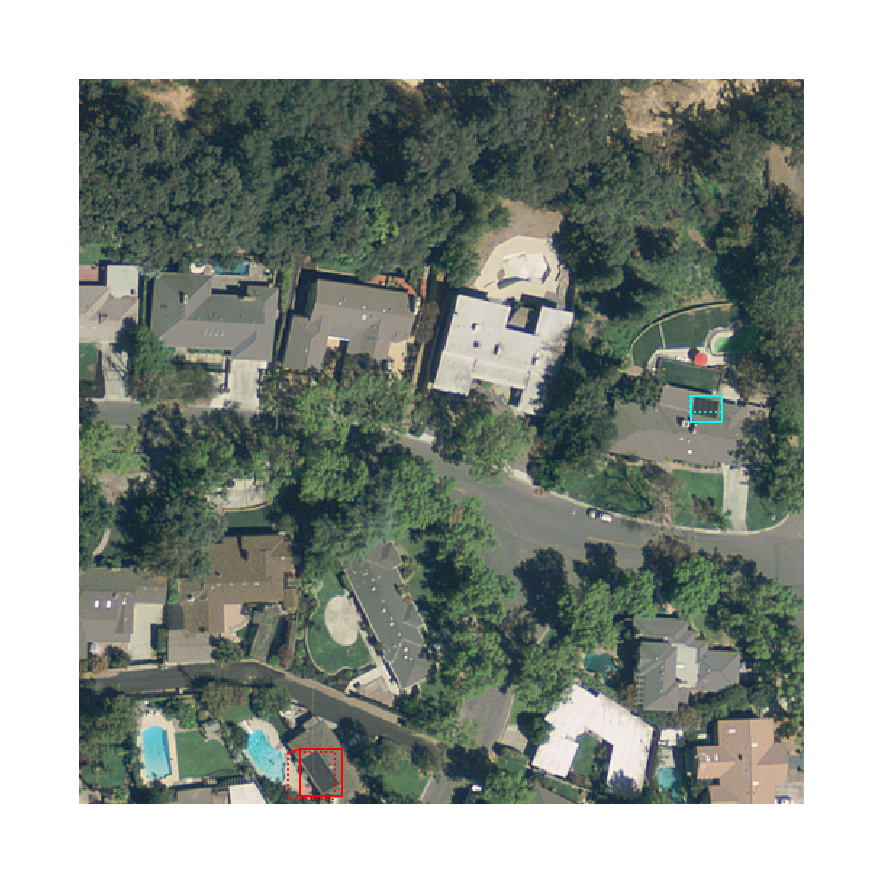

In [14]:
b = 0

# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(dataset.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))

# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], 
                     refined_boxes=refined_anchors, ax=ax)

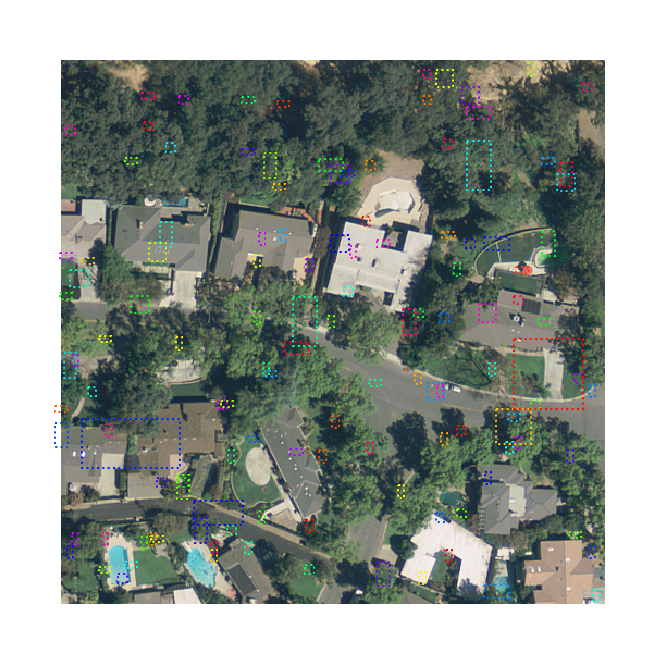

In [15]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

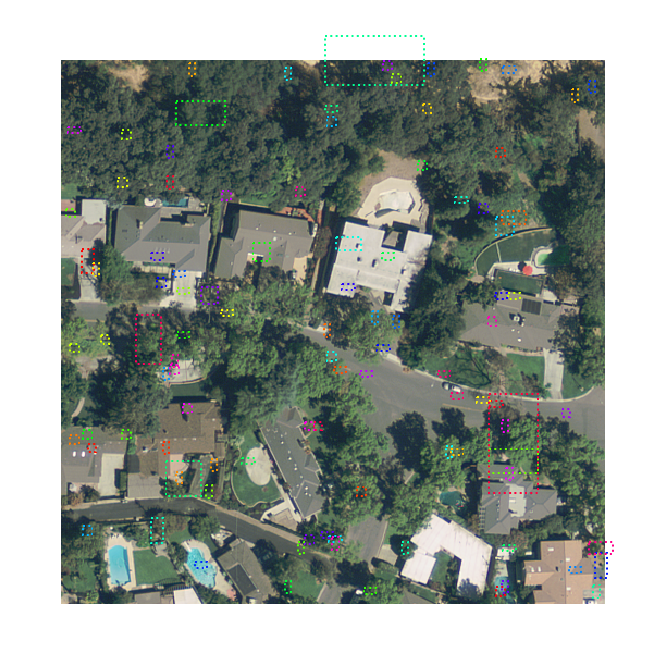

In [16]:
# Show neutral anchors. They don't contribute to training.
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

## ROIs

Typically, the RPN network generates region proposals (a.k.a. Regions of Interest, or ROIs). The data generator has the ability to generate proposals as well for illustration and testing purposes. These are controlled by the `random_rois` parameter.

Positive ROIs:  32
Negative ROIs:  96
Positive Ratio: 0.25
Unique ROIs: 128 out of 128


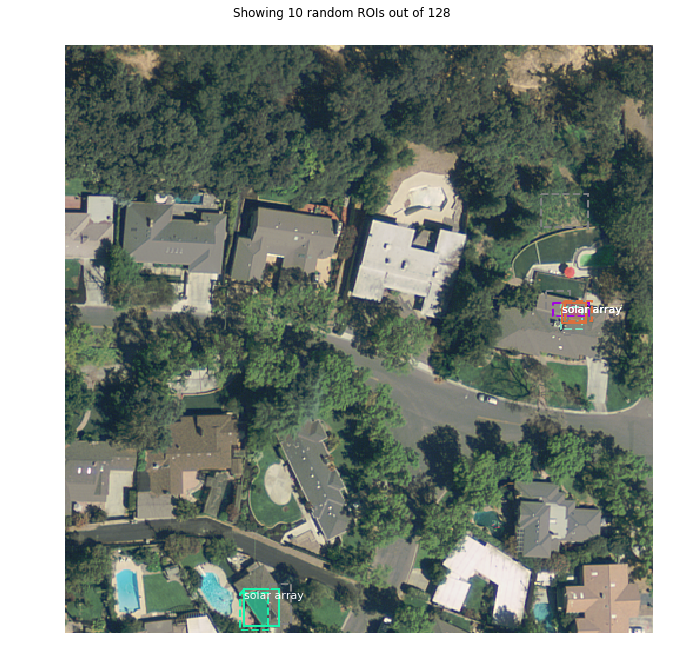

In [17]:
if random_rois:
    # Class aware bboxes
    bbox_specific = mrcnn_bbox[b, np.arange(mrcnn_bbox.shape[1]), mrcnn_class_ids[b], :]

    # Refined ROIs
    refined_rois = utils.apply_box_deltas(rois[b].astype(np.float32), bbox_specific[:,:4] * config.BBOX_STD_DEV)

    # Class aware masks
    mask_specific = mrcnn_mask[b, np.arange(mrcnn_mask.shape[1]), :, :, mrcnn_class_ids[b]]

    visualize.draw_rois(sample_image, rois[b], refined_rois, mask_specific, mrcnn_class_ids[b], dataset.class_names)
    
    # Any repeated ROIs?
    rows = np.ascontiguousarray(rois[b]).view(np.dtype((np.void, rois.dtype.itemsize * rois.shape[-1])))
    _, idx = np.unique(rows, return_index=True)
    print("Unique ROIs: {} out of {}".format(len(idx), rois.shape[1]))

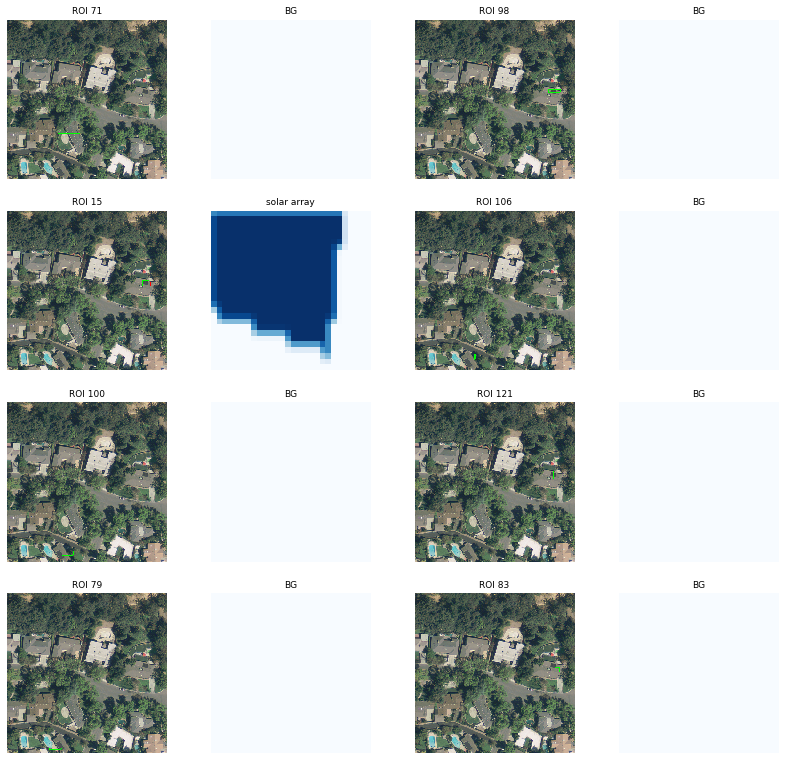

In [18]:
if random_rois:
    # Dispalay ROIs and corresponding masks and bounding boxes
    ids = random.sample(range(rois.shape[1]), 8)

    images = []
    titles = []
    for i in ids:
        image = visualize.draw_box(sample_image.copy(), rois[b,i,:4].astype(np.int32), [255, 0, 0])
        image = visualize.draw_box(image, refined_rois[i].astype(np.int64), [0, 255, 0])
        images.append(image)
        titles.append("ROI {}".format(i))
        images.append(mask_specific[i] * 255)
        titles.append(dataset.class_names[mrcnn_class_ids[b,i]][:20])

    display_images(images, titles, cols=4, cmap="Blues", interpolation="none")

In [19]:
# Check ratio of positive ROIs in a set of images.
if random_rois:
    limit = 10
    temp_g = modellib.data_generator(
        dataset, config, shuffle=True, random_rois=10000, 
        batch_size=1, detection_targets=True)
    total = 0
    for i in range(limit):
        _, [ids, _, _] = next(temp_g)
        positive_rois = np.sum(ids[0] > 0)
        total += positive_rois
        print("{:5} {:5.2f}".format(positive_rois, positive_rois/ids.shape[1]))
    print("Average percent: {:.2f}".format(total/(limit*ids.shape[1])))

   32  0.25
   32  0.25
   32  0.25
   32  0.25
   32  0.25
   32  0.25
   32  0.25
   32  0.25
   32  0.25
   32  0.25
Average percent: 0.25
